In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import json
import math

In [2]:
ROUTES_FILE = "../data/routes.csv"
ROUTES_FILE_CLEANED_CSV = "../data/cleaned/cleaned_earth_routes.csv"
AIRLINES_ROUTES_FILE_CLEANED_JSON = "../data/cleaned/cleaned_earth_airlines_routes.csv"

AIRPORTS_FILE_CLEANED_CSV = "../data/cleaned/cleaned_earth_airports.csv"
AIRLINES_FILE_CLEANED_CSV = "../data/cleaned/cleaned_earth_airlines.csv"

# Read Data

In [3]:
routes_df = pd.read_csv(ROUTES_FILE, 
#                        index_col = 1, 
                       header=0)

In [4]:
airports_df = pd.read_csv(AIRPORTS_FILE_CLEANED_CSV, 
                         index_col = 0, 
                         header=0)
# airports_df

In [5]:
airlines_df = pd.read_csv(AIRLINES_FILE_CLEANED_CSV, 
                         index_col = 0, 
                         header=0)
# airlines_df

# Route Data Cleaning

In [6]:
routes_df = routes_df[routes_df.Codeshare != 'Y']

In [7]:
routes_df = routes_df[routes_df.Stops == 0]

In [8]:
routes_df = routes_df[routes_df['Source airport'].str.len().eq(3)]

In [9]:
routes_df = routes_df[routes_df['Destination airport'].str.len().eq(3)]

In [10]:
routes_df.drop(["Equipment","Stops", "Codeshare", "Airline_ID", "Source airport ID", "Destination airport ID"], inplace = True, axis =1)

In [11]:
list(routes_df.columns.values)

['Airline', 'Source airport', 'Destination airport']

In [12]:
routes_df.rename(columns = {'Airline':'Airline_Code',
                            'Source airport':'Airport_Code_Source',
                            'Destination airport':'Airport_Code_Destination'}, inplace = True)

In [13]:
routes_df.reset_index(drop= True, inplace=True)
routes_df

,Airline_Code,Airport_Code_Source,Airport_Code_Destination
0,2B,AER,KZN
1,2B,ASF,KZN
2,2B,ASF,MRV
3,2B,CEK,KZN
4,2B,CEK,OVB
...,...,...,...
53050,ZL,WYA,ADL
53051,ZM,DME,FRU
53052,ZM,FRU,DME
53053,ZM,FRU,OSS


# Createing Routes Dataframe with Distances

In [14]:
def getDistanceFromLatLonInKm(loc):
    lat1 = loc["Latitude_Source"]
    lon1 = loc["Longitude_Source"]
    lat2 = loc["Latitude_Destination"]
    lon2 = loc["Longitude_Destination"]
    R = 6371 # Radius of the earth in km
    dLat = deg2rad(lat2-lat1)  # deg2rad below
    dLon = deg2rad(lon2-lon1)
    a = math.sin(dLat/2) * math.sin(dLat/2) + math.cos(deg2rad(lat1)) * math.cos(deg2rad(lat2)) * math.sin(dLon/2) * math.sin(dLon/2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    d = R * c # Distance in km
    return d

def deg2rad(deg):
    return deg * (math.pi/180)

# loc = {"Latitude_Source":-6.081690,
#        "Longitude_Source":145.391998,
#        "Latitude_Destination":23.640556,
#        "Longitude_Destination":57.487500}
# getDistanceFromLatLonInKm(loc)

In [15]:
route_complete_df = routes_df.join(airlines_df.set_index('IATA'), 
                                   on='Airline_Code', 
                                   how="inner").join(airports_df.set_index('IATA'), 
                                                     on="Airport_Code_Source", 
                                                     rsuffix="_Source",
                                                     how="inner").join(airports_df.set_index('IATA'), 
                                                                       on="Airport_Code_Destination", 
                                                                       how="inner",
                                                                       rsuffix="_Destination")

In [16]:
route_complete_df.rename(columns = {'Name':'Airline_Name',
                                    'City':'City_Source',
                                    'Country':'Airline_Country',
                                    'Latitude':'Latitude_Source',
                                    'Longitude':'Longitude_Source',
                                    'Altitude':'Altitude_Source',}, inplace = True)

In [17]:
route_complete_df['Distance_Km'] = route_complete_df.apply(getDistanceFromLatLonInKm, axis=1)

In [18]:
route_complete_df.reset_index(drop= True, inplace=True)
route_complete_df.head()

,Airline_Code,Airport_Code_Source,Airport_Code_Destination,Airline_Name,Airline_Country,Name_Source,City_Source,Country_Source,Latitude_Source,Longitude_Source,Altitude_Source,Name_Destination,City_Destination,Country_Destination,Latitude_Destination,Longitude_Destination,Altitude_Destination,Distance_Km
0,2B,AER,KZN,Aerocondor,Portugal,Sochi International Airport,Sochi,Russia,43.449902,39.956600,89,Kazan International Airport,Kazan,Russia,55.606201,49.278702,411,1506.825604
1,2B,ASF,KZN,Aerocondor,Portugal,Astrakhan Airport,Astrakhan,Russia,46.283298,48.006302,-65,Kazan International Airport,Kazan,Russia,55.606201,49.278702,411,1040.438320
2,2B,CEK,KZN,Aerocondor,Portugal,Chelyabinsk Balandino Airport,Chelyabinsk,Russia,55.305801,61.503300,769,Kazan International Airport,Kazan,Russia,55.606201,49.278702,411,770.508500
3,2B,DME,KZN,Aerocondor,Portugal,Domodedovo International Airport,Moscow,Russia,55.408798,37.906300,588,Kazan International Airport,Kazan,Russia,55.606201,49.278702,411,715.649350
4,S7,DME,KZN,S7 Airlines,Russia,Domodedovo International Airport,Moscow,Russia,55.408798,37.906300,588,Kazan International Airport,Kazan,Russia,55.606201,49.278702,411,715.649350


# Routes Vizulization

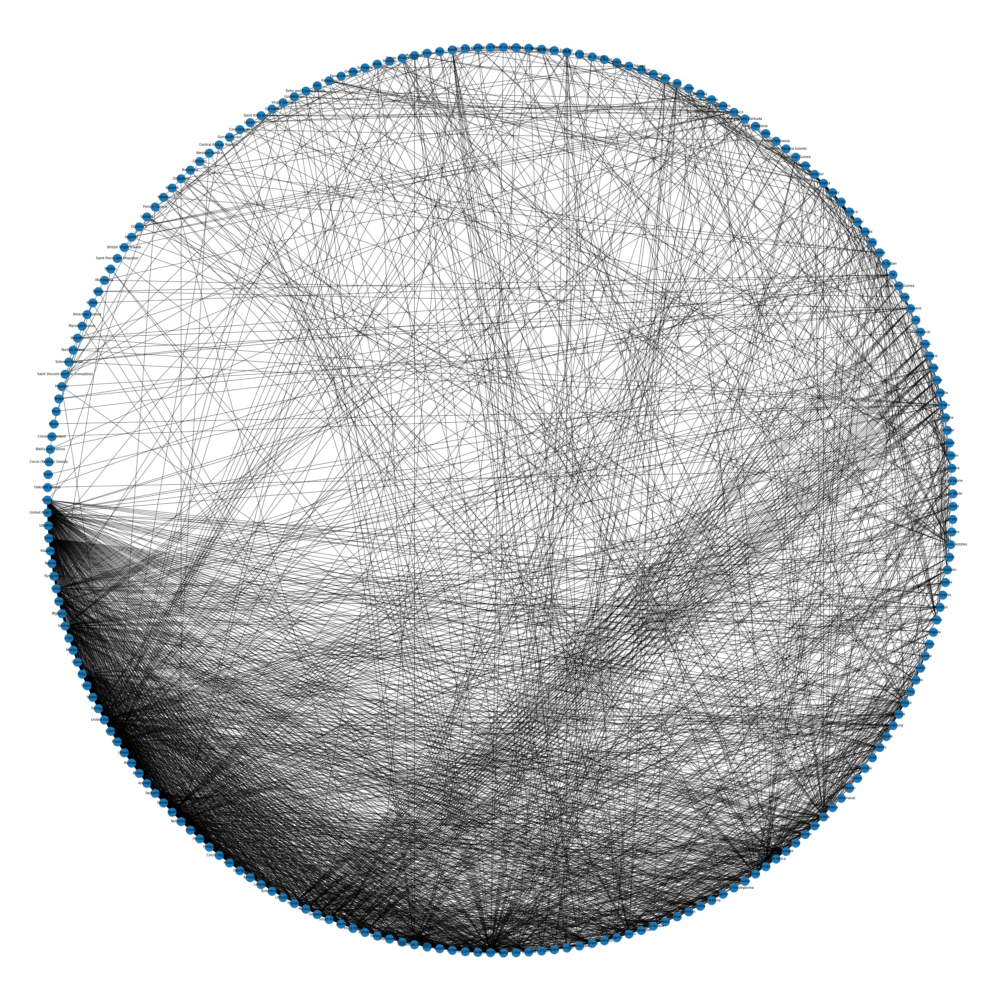

In [19]:
country_route_graph = nx.from_pandas_edgelist(route_complete_df, 
                                              'Country_Source', 
                                              'Country_Destination', 
                                              'Distance_Km')
fig = plt.figure(1, figsize=(50, 50), dpi=60)
nx.draw_shell(country_route_graph, node_size=1000, with_labels=True)

In [20]:
routes_graph = nx.from_pandas_edgelist(route_complete_df, 
                                       'Airport_Code_Source', 
                                       'Airport_Code_Destination',
                                       'Distance_Km')
# fig = plt.figure(1, figsize=(500, 500), dpi=50)
# nx.draw_shell(routes_graph, node_size=1000, with_labels=True)

<Figure size 25000x25000 with 0 Axes>

# Save Route Data

In [21]:
route_complete_df.to_csv(ROUTES_FILE_CLEANED_CSV)

In [22]:
airplanes_routes_df = nx.to_pandas_edgelist(routes_graph)

In [23]:
airplanes_routes_df.to_csv(AIRLINES_ROUTES_FILE_CLEANED_JSON)